## Generative model
$$ f(t) = \sigma_T\;\mathcal{IBM}(t) + \sigma_S\;\mathcal{IBB}_\Theta(t)$$

with $\sigma_T, \sigma_S, \sigma_N>0$ and where

$$\mathcal{IBM}(t) = \int_0^t \mathcal{BM}(\tau)d\tau=\int_0^t (t-\tau) \mathcal{W}(d\tau),$$

$$\mathcal{IBB}_\Theta(t) = \int_0^\Theta \rho_2(t-\tau) \mathcal{W}_\Theta (d\tau),$$


are the zero-mean integrated Brownian motions/bridges respectively, with covariances

$$\kappa_{\mathcal{IBM}}(s, t)= \min(s, t) (ts -(t+s)\min(s, t)/2 + \min(s, t)^2/3)  $$

$$\kappa_{\mathcal{IBB}_\Theta}(s, t)=\rho_4(t-s).$$



In [259]:
import numpy as np
period = 1
forecast_times = np.linspace(0, 10, 2048)
seasonal_forecast_times = np.linspace(0, period, 512)
sample_paths = 6

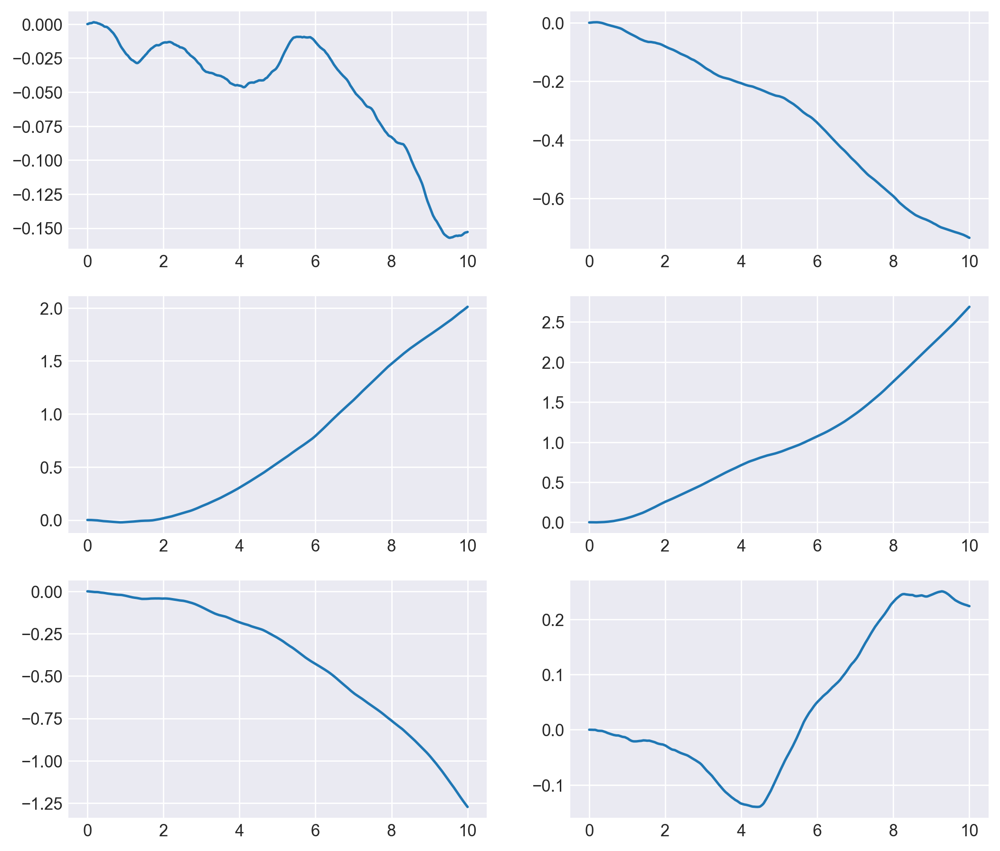

In [260]:
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
plt.rcParams['figure.figsize'] = [10, 9]
plt.rcParams['figure.dpi'] = 250
colors = dict(blue='#1f77b4', orange='#ff7f0e', green='#2ca02c', red='#d62728', purple='#9467bd', brown='#8c564b',
              pink='#e377c2', gray='#7f7f7f', olive='#bcbd22', cyan='#17becf', black='#4f4f4f')

ibm_ker = lambda t, s: np.fmin(s, t) * (t * s - (1/2) * np.fmin(t, s) * (t+s) + np.fmin(t, s)**2/3)
ibm_cov = 3 * ibm_ker(forecast_times[:, None], forecast_times[None, :]) / (forecast_times.max())**3
rng = np.random.default_rng(0)
ibm_samples = rng.multivariate_normal(0 * forecast_times, ibm_cov, size=sample_paths)
for i in range(sample_paths):
    plt.subplot(3,2,i+1)
    plt.plot(forecast_times, ibm_samples[i])

/var/folders/fw/5bd0378d07g0fv04n5j2yn4h0000gp/T/ipykernel_75587/3520854089.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  ibb_samples = rng.multivariate_normal(0 * forecast_times, ibb_cov, size=sample_paths)


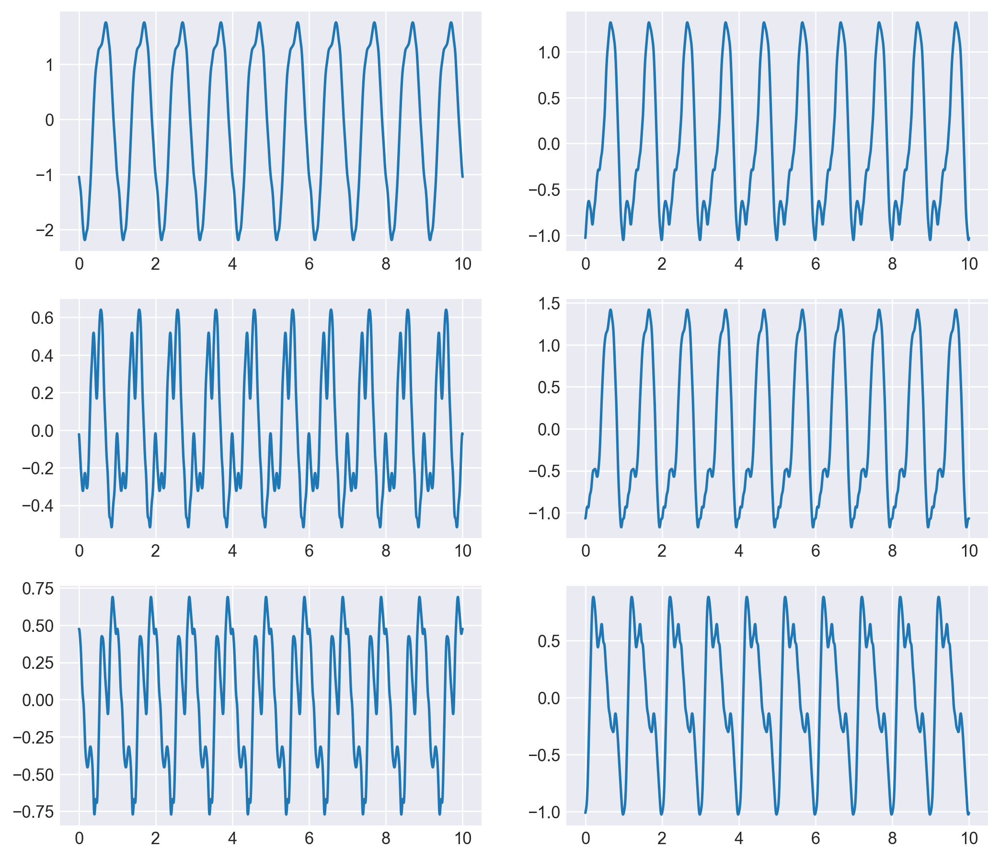

In [261]:
from periodispline.splines.green.univariate import GreenIteratedDerivative
ibb_ker = GreenIteratedDerivative(exponent=4, period=1)
ibb_cov = ibb_ker(forecast_times[:, None] - forecast_times[None, :]) / np.max(ibb_ker(seasonal_forecast_times))
ibb_samples = rng.multivariate_normal(0 * forecast_times, ibb_cov, size=sample_paths)
for i in range(sample_paths):
    plt.subplot(3,2,i+1)
    plt.plot(forecast_times, ibb_samples[i])

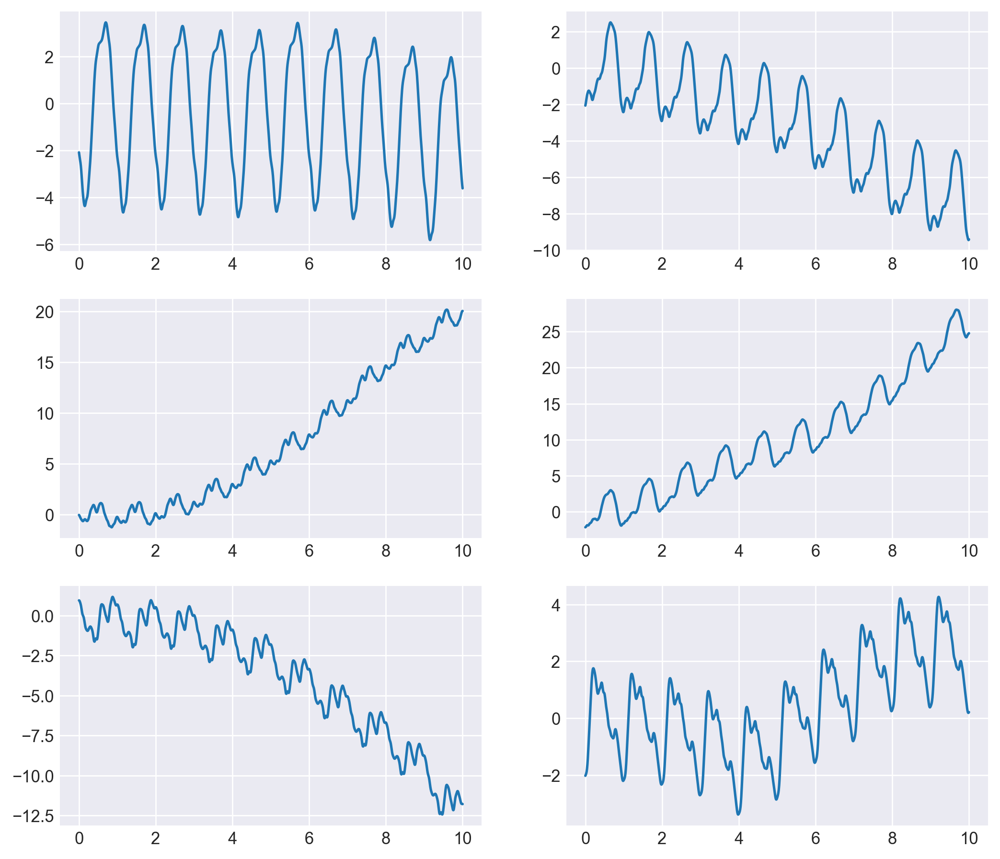

In [262]:
sigmaT = 10
sigmaS = 2
ibm_samples *= sigmaT
ibb_samples *= sigmaS
sum_process = ibm_samples + ibb_samples
for i in range(sample_paths):
    plt.subplot(3,2,i+1)
    plt.plot(forecast_times, sum_process[i])

(-0.5, 10.5, -14.767117393772448, 30.079306164733243)

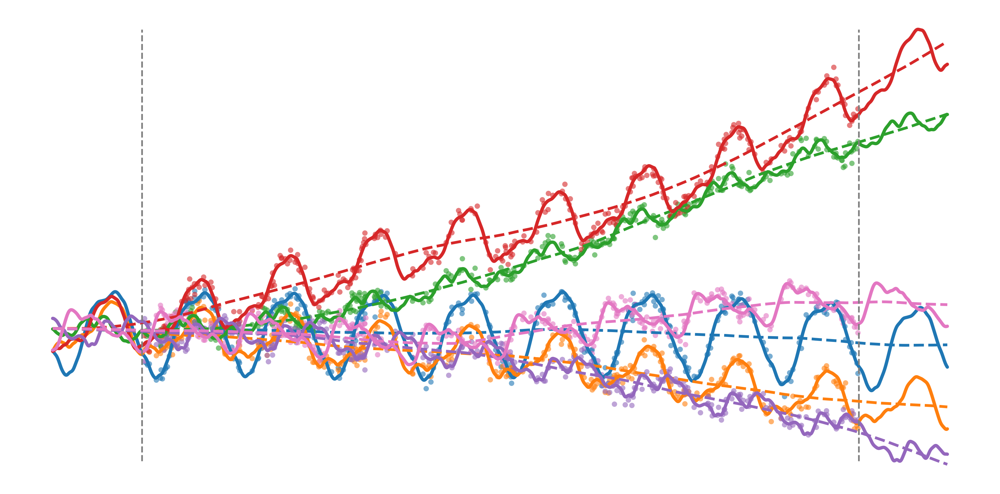

In [263]:
buffer = 10
sample_rate = 0.2
sample_bool = rng.binomial(n=1, p =sample_rate, size=forecast_times[forecast_times.size//buffer:forecast_times.size-forecast_times.size//buffer].size).astype(bool)
sample_times = forecast_times[forecast_times.size//buffer:forecast_times.size-forecast_times.size//buffer][sample_bool]
sigma_noise = 1/2
sample_values = sum_process[:, forecast_times.size//buffer:forecast_times.size-forecast_times.size//buffer][:, sample_bool] + sigma_noise * rng.standard_normal(size=(sample_paths, sample_times.size))
plt.figure(figsize=[16,8])
col_sub = ['blue', 'orange', 'green', 'red', 'purple', 'pink']
for i in range(sample_paths):
    plt.plot(forecast_times, sum_process[i], color=colors[col_sub[i]], linewidth=3)
    plt.plot(forecast_times, ibm_samples[i], '--',color=colors[col_sub[i]], linewidth=2.5)
    plt.scatter(sample_times, sample_values[i], color=colors[col_sub[i]],marker='o', s=24, alpha=0.6, linewidth=0)
plt.plot([forecast_times[forecast_times.size//buffer], forecast_times[forecast_times.size//buffer]],[sum_process.min(), sum_process.max()], '--', color=colors['gray'])
plt.plot([forecast_times[forecast_times.size-forecast_times.size//buffer], forecast_times[forecast_times.size-forecast_times.size//buffer]],[sum_process.min(), sum_process.max()], '--', color=colors['gray'])
plt.axis('tight')
plt.axis('off')

In [264]:
import pandas as pd

def mse(arr: np.ndarray, root: bool = True, weights: np.ndarray = 1) -> float:
    """Compute (potentially weighted and/or rooted) mean squared error."""
    weights = 0 * arr + weights
    mse = np.sum((weights * arr) ** 2) / np.sum(weights ** 2)
    score = np.sqrt(mse) if root else mse
    return np.round(score, 4)

def mpe(arr1: np.ndarray, arr2: np.ndarray, weights: np.ndarray = 1) -> float:
    """Compute (potentially weighted) mean percentage error."""
    weights = 0 * arr1 + weights
    return np.round(100 * np.sum(weights * np.abs(arr1) / np.abs(arr2)) / np.sum(weights), 4)

def r2(arr1: np.ndarray, arr2: np.ndarray, n_params: int = -1, weights: np.ndarray = 1, adj: bool = True) -> float:
    """Compute (potentially weighted and/or adjusted) R2 coefficient."""
    R2 = 1 - (np.linalg.norm(weights * arr1) / np.linalg.norm(weights * (arr2 - np.mean(arr2)))) ** 2
    if n_params == -1:
        AdjR2 = np.NaN
    else:
        AdjR2 = 1 - (1 - R2) * (arr1.size - 1) / (arr1.size - n_params)
    if adj:
        return np.round(AdjR2, 4)
    else:
        return np.round(R2, 4)


def compute_r2(sum_fit, trend_fit, seas_fit, sum_ref, trend_ref, seas_ref, n_params,
               idx: int, method_name: str) -> pd.DataFrame:
    df = pd.concat({f'{method_name}': pd.DataFrame(
                {'sum': r2(sum_fit - sum_ref, sum_ref, n_params, adj=True) ,
                 'trend': r2(trend_fit-trend_ref, trend_ref, n_params, adj=True),
                 'season': r2(seas_fit-seas_ref, seas_ref, n_params, adj=True),
                 }, index=[idx])}, axis = 1, names=['Method', 'Component'])
    df.index.name = 'Sample path'
    return df


/Users/mmjasime/miniconda3/envs/prism/lib/python3.8/site-packages/pycsou/core/functional.py:152: UserWarning: For differentiable and/or linear maps, consider the dedicated classes DifferentiableMap and LinearOperator.
  warnings.warn(


Initial penalty: 1


  0%|          | 0/10000 [00:00<?, ?it/s]

/Users/mmjasime/miniconda3/envs/prism/lib/python3.8/site-packages/pycsou/core/functional.py:152: UserWarning: For differentiable and/or linear maps, consider the dedicated classes DifferentiableMap and LinearOperator.
  warnings.warn(


Initial penalty: 1


  0%|          | 0/10000 [00:00<?, ?it/s]

/Users/mmjasime/miniconda3/envs/prism/lib/python3.8/site-packages/pycsou/core/functional.py:152: UserWarning: For differentiable and/or linear maps, consider the dedicated classes DifferentiableMap and LinearOperator.
  warnings.warn(


Initial penalty: 1


  0%|          | 0/10000 [00:00<?, ?it/s]

/Users/mmjasime/miniconda3/envs/prism/lib/python3.8/site-packages/pycsou/core/functional.py:152: UserWarning: For differentiable and/or linear maps, consider the dedicated classes DifferentiableMap and LinearOperator.
  warnings.warn(


Initial penalty: 1


  0%|          | 0/10000 [00:00<?, ?it/s]

/Users/mmjasime/miniconda3/envs/prism/lib/python3.8/site-packages/pycsou/core/functional.py:152: UserWarning: For differentiable and/or linear maps, consider the dedicated classes DifferentiableMap and LinearOperator.
  warnings.warn(


Initial penalty: 1


  0%|          | 0/10000 [00:00<?, ?it/s]

/Users/mmjasime/miniconda3/envs/prism/lib/python3.8/site-packages/pycsou/core/functional.py:152: UserWarning: For differentiable and/or linear maps, consider the dedicated classes DifferentiableMap and LinearOperator.
  warnings.warn(


Initial penalty: 1


  0%|          | 0/10000 [00:00<?, ?it/s]

Method          Prism                    
Component         sum     trend    season
Sample path                              
1            0.995100  0.880300  0.998200
2            0.992200  0.991600  0.992500
3            0.997400  0.997600  0.972600
4            0.999400  0.999500  0.997300
5            0.989200  0.990100  0.982400
6            0.980700  0.973400  0.991100
Avg.         0.992333  0.972083  0.989017
Std.         0.006170  0.041901  0.008969

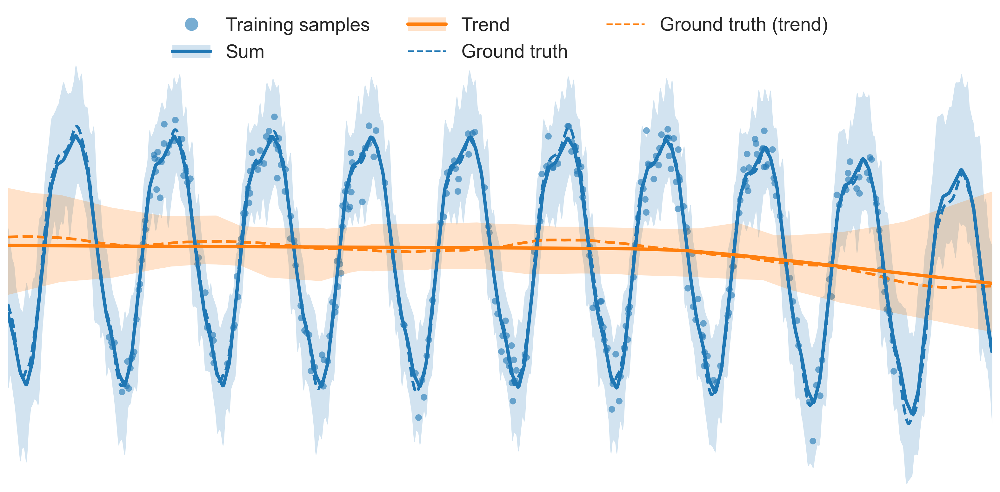

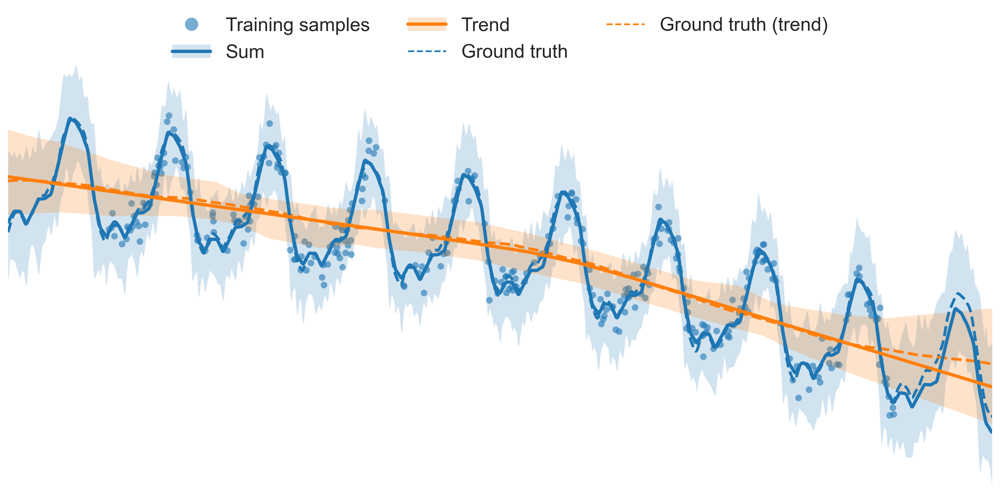

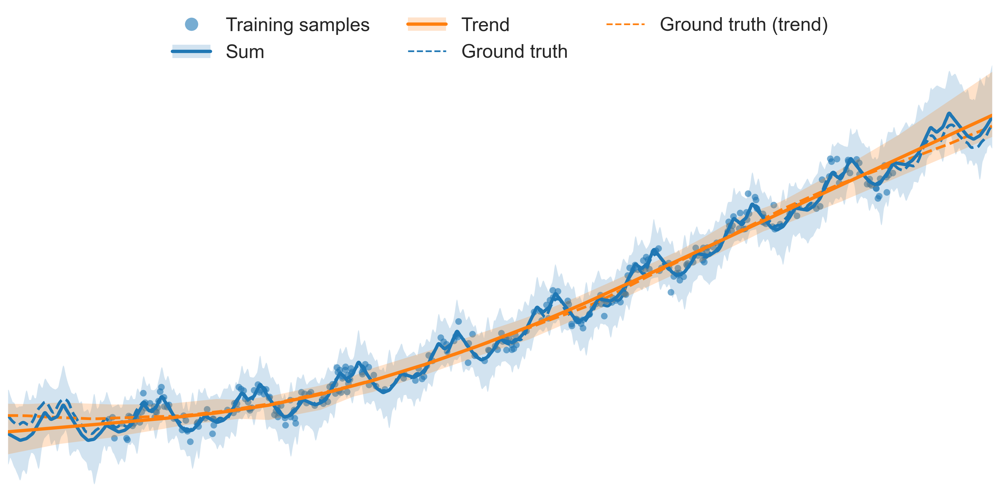

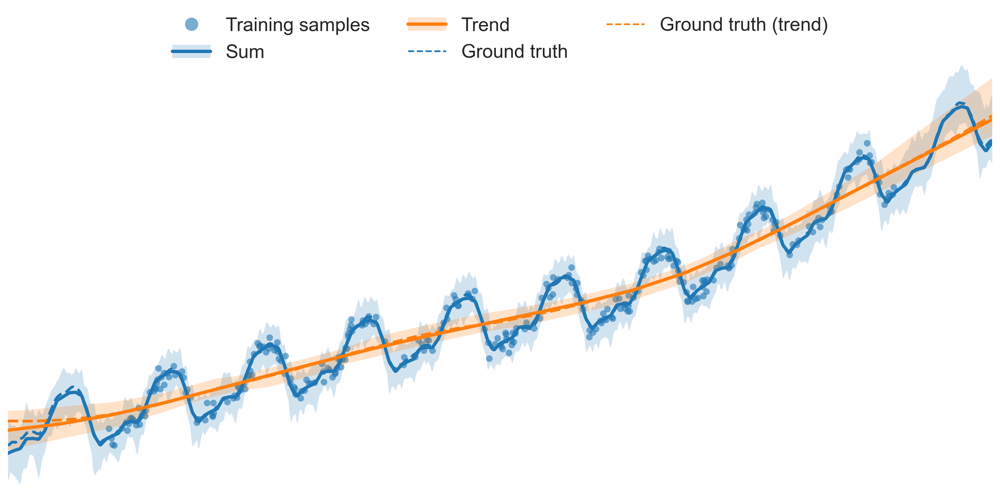

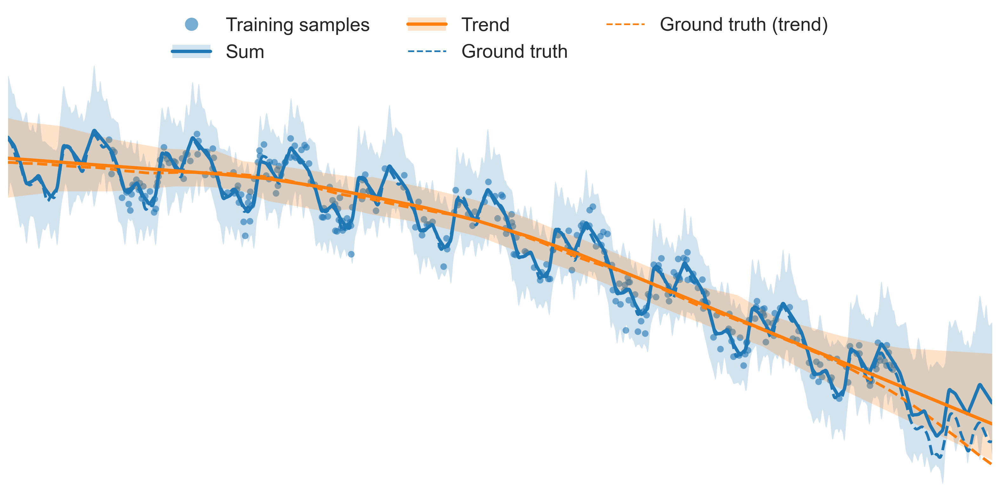

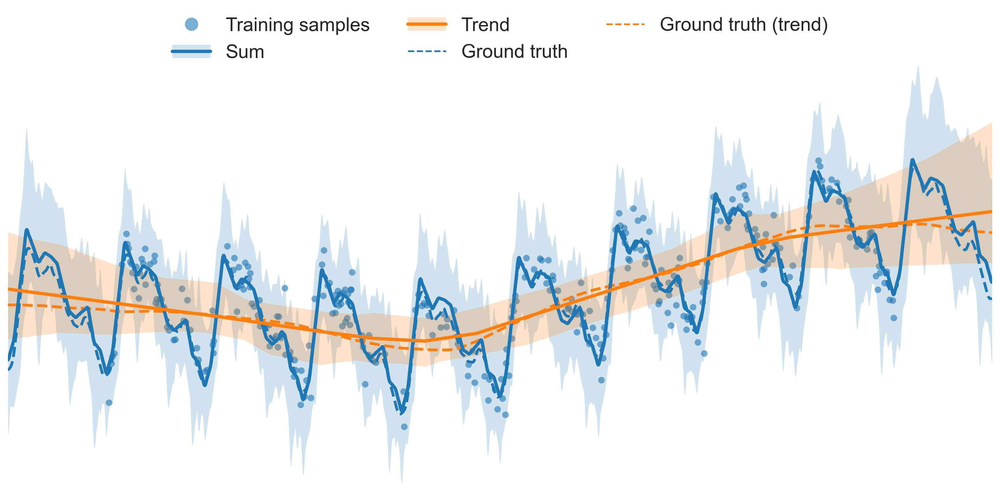

In [265]:
import prism

metrics=[]
for i in range(sample_paths):
    streg = prism.SeasonalTrendRegression(sample_times=sample_times,
                                          sample_values=sample_values[i],
                                          period=period, forecast_times=forecast_times,
                                          seasonal_forecast_times=seasonal_forecast_times, penalty_tuning=False,
                                          penalty_strength=1,
                                          nb_of_knots=(16, 16), spline_orders=(2, 2),
                                          robust=False, tol=1e-3)
    # Fit the model
    coeffs, mu = streg.fit(verbose=None)
    pseas, ptrend, psum, pgrowth = streg.predict(growth=True)
    pmin_values, pmax_values, _ = streg.sample_credible_region(n_samples=1e4, return_samples=False)
    quantile_gauss = 2.33
    plt.figure(figsize=[16,7])
    sc_train = plt.errorbar(sample_times, sample_values[i],
                            yerr=quantile_gauss * sigma_noise, elinewidth=0,
                            ecolor=colors['cyan'], alpha=0.6, zorder=0.5, linewidth=0, marker='o',
                            markerfacecolor=colors['blue'],
                            mew=0, markersize=6)
    lin_sum, = plt.plot(forecast_times, psum, '-', linewidth=3, color=colors['blue'], zorder=2)
    plt.plot(forecast_times, sum_process[i], '--', linewidth=2.5, color=colors['blue'],
             zorder=1.5)
    fill_sum = plt.fill_between(forecast_times, pmin_values['sum'], pmax_values['sum'],
                                alpha=0.2, color=colors['blue'], zorder=1, linewidth=0)
    lin_trend, = plt.plot(forecast_times, ptrend, '-', linewidth=3, color=colors['orange'], zorder=2)
    plt.plot(forecast_times, ibm_samples[i], '--', linewidth=2.5, color=colors['orange'],
             zorder=1.5)
    fill_trend = plt.fill_between(forecast_times, pmin_values['trend'], pmax_values['trend'],
                                  alpha=0.22, color=colors['orange'], zorder=1, linewidth=0)
    # For the legend only, do not appear on figure.
    gt_sum, = plt.plot(forecast_times, 100 + sum_process[i], '--', linewidth=1.5,
                       color=colors['blue'],
                       zorder=1.5)
    gt_trend, = plt.plot(forecast_times, 100 + sum_process[i], '--', linewidth=1.5,
                         color=colors['orange'],
                         zorder=1.5)
    plt.ylim(np.fmin(pmax_values['sum'].min(), pmin_values['sum'].min()), np.fmax(pmax_values['sum'].max(), pmin_values['sum'].max()))
    plt.xlim(forecast_times.min(), forecast_times.max())
    plt.axis('off')
    plt.figlegend([sc_train, (lin_sum, fill_sum), (lin_trend, fill_trend), gt_sum, gt_trend],
                  ['Training samples', 'Sum', 'Trend',
                   'Ground truth', 'Ground truth (trend)'],
                  fontsize='xx-large', loc=9, ncol=3, markerscale=2,
                  fancybox=False)
    metrics.append(compute_r2(psum, ptrend, psum-ptrend,sum_process[i], ibm_samples[i], ibb_samples[i], 2*16, i +1, 'Prism'))
pmetrics=pd.concat(metrics, axis=0)
pmetrics.loc['Avg.'] = pmetrics.mean(axis=0)
pmetrics.loc['Std.'] = pmetrics.std(axis=0)
pmetrics

In [266]:
pmetrics

Method          Prism                    
Component         sum     trend    season
Sample path                              
1            0.995100  0.880300  0.998200
2            0.992200  0.991600  0.992500
3            0.997400  0.997600  0.972600
4            0.999400  0.999500  0.997300
5            0.989200  0.990100  0.982400
6            0.980700  0.973400  0.991100
Avg.         0.992333  0.972083  0.989017
Std.         0.006170  0.041901  0.008969

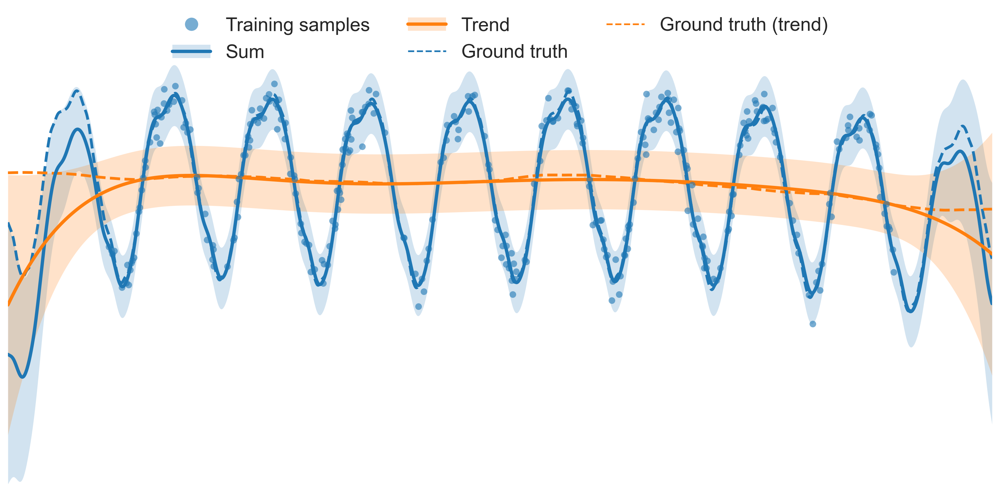

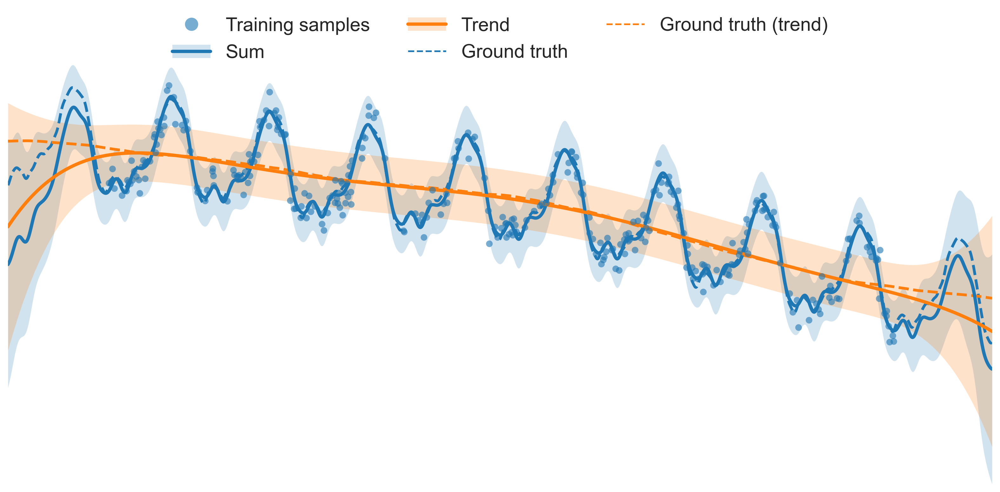

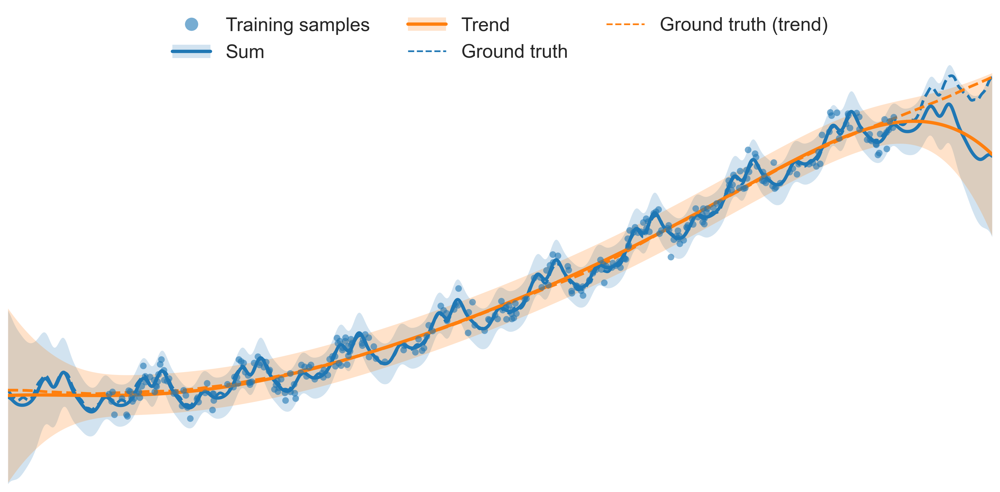

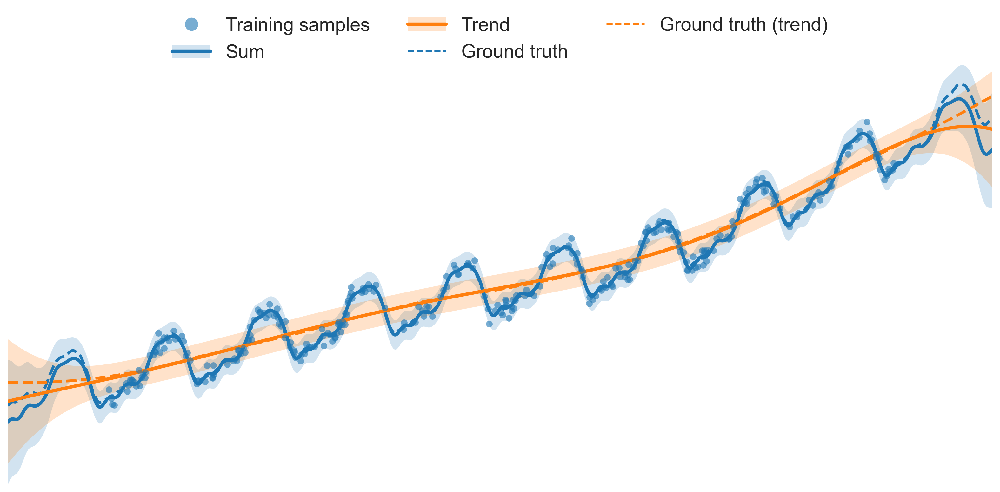

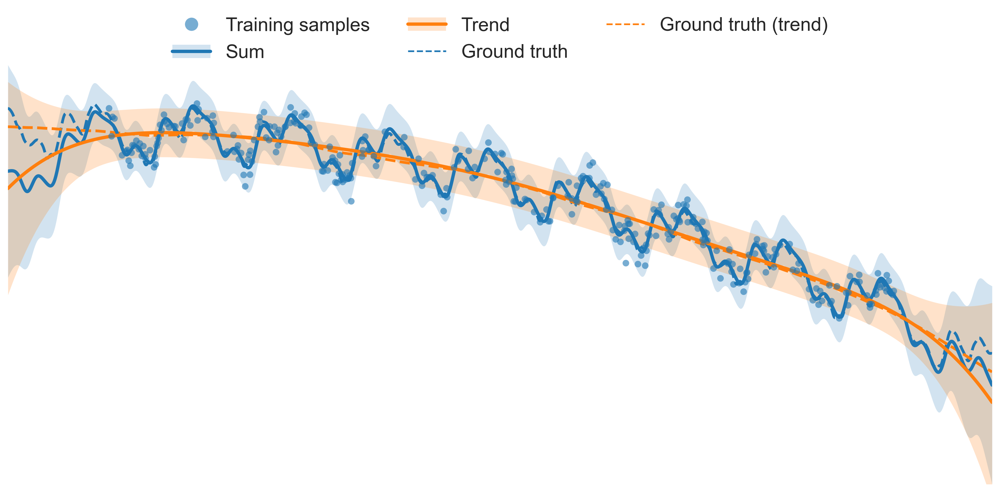

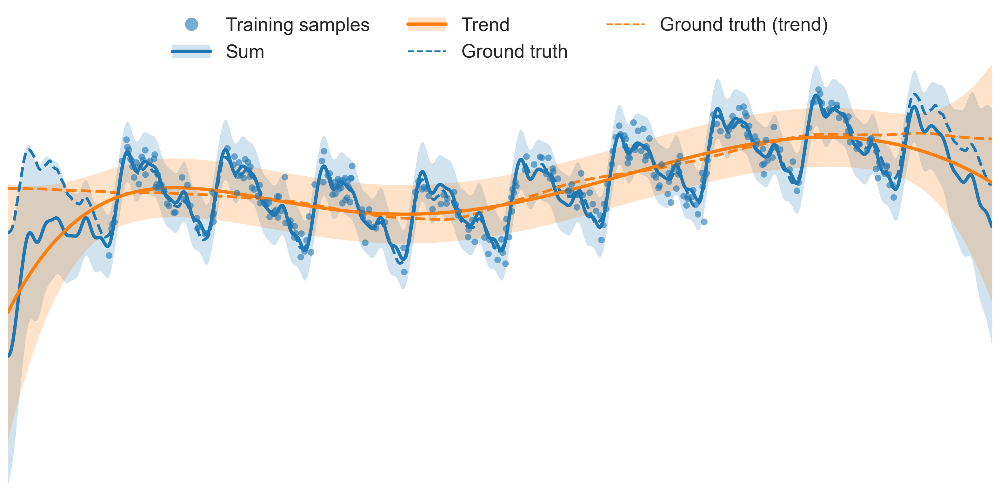

In [267]:
import prism._util as priu
import gml_packages.ccgrcv.ccg_filter as ccgfilt

metrics=[]
for i in range(sample_paths):
    filt = ccgfilt.ccgFilter(xp=sample_times, yp=sample_values[i],
                             timezero=-1, numpolyterms=7, numharmonics=7)
    ftimes, fcomponents, fresiduals, fmin_values, fmax_values = priu.postprocess_ccgfilt(filt, seasonal_forecast_times,
                                                                                         forecast_times)
    plt.figure(figsize=[16,7])
    sc_train = plt.errorbar(sample_times, sample_values[i],
                            yerr=quantile_gauss * sigma_noise, elinewidth=0,
                            ecolor=colors['cyan'], alpha=0.6, zorder=2.5, linewidth=0, marker='o',
                            markerfacecolor=colors['blue'],
                            mew=0, markersize=6)
    lin_sum, = plt.plot(forecast_times, fcomponents['sum'], '-', linewidth=3, color=colors['blue'], zorder=2)
    plt.plot(forecast_times, sum_process[i], '--', linewidth=2.5, color=colors['blue'],
             zorder=1.5)
    fill_sum = plt.fill_between(forecast_times, fmin_values['sum'], fmax_values['sum'],
                                alpha=0.2, color=colors['blue'], zorder=1, linewidth=0)
    lin_trend, = plt.plot(forecast_times, fcomponents['trend'], '-', linewidth=3, color=colors['orange'], zorder=2)
    plt.plot(forecast_times, ibm_samples[i], '--', linewidth=2.5, color=colors['orange'],
             zorder=1.5)
    fill_trend = plt.fill_between(forecast_times, fmin_values['trend'], fmax_values['trend'],
                                  alpha=0.22, color=colors['orange'], zorder=1, linewidth=0)
    # For the legend only, do not appear on figure.
    gt_sum, = plt.plot(forecast_times, 100 + sum_process[i], '--', linewidth=1.5,
                       color=colors['blue'],
                       zorder=1.5)
    gt_trend, = plt.plot(forecast_times, 100 + sum_process[i], '--', linewidth=1.5,
                         color=colors['orange'],
                         zorder=1.5)
    plt.ylim(np.fmin(fmax_values['sum'].min(), fmin_values['sum'].min()), np.fmax(fmin_values['sum'].max(),fmax_values['sum'].max()))
    plt.xlim(forecast_times.min(), forecast_times.max())
    plt.axis('off')
    plt.figlegend([sc_train, (lin_sum, fill_sum), (lin_trend, fill_trend), gt_sum, gt_trend],
                  ['Training samples', 'Sum', 'Trend',
                   'Ground truth', 'Ground truth (trend)'],
                  fontsize='xx-large', loc=9, ncol=3, markerscale=2,
                  fancybox=False)
    metrics.append(compute_r2(fcomponents['sum'], fcomponents['trend'], fcomponents['sum']-fcomponents['trend'], sum_process[i], ibm_samples[i], ibb_samples[i], 14, i +1, 'Polynomial Reg.'))
fmetrics=pd.concat(metrics, axis=0)
fmetrics.loc['Avg.'] = fmetrics.mean(axis=0)
fmetrics.loc['Std.'] = fmetrics.std(axis=0)


In [268]:
metrics = pd.DataFrame(columns=pd.MultiIndex.from_product([['Sum', 'Trend', 'Seasonal'], ['Prism', 'Poly']], names=['Component', 'Method']))
metrics['Sum', 'Prism'] = pmetrics[('Prism', 'sum')]
metrics['Sum', 'Poly'] = fmetrics[('Polynomial Reg.', 'sum')]
metrics['Trend', 'Prism'] = pmetrics[('Prism', 'trend')]
metrics['Trend', 'Poly'] = fmetrics[('Polynomial Reg.', 'trend')]
metrics['Seasonal', 'Prism'] = pmetrics[('Prism', 'season')]
metrics['Seasonal', 'Poly'] = fmetrics[('Polynomial Reg.', 'season')]
metrics

Component         Sum               Trend            Seasonal          
Method          Prism      Poly     Prism      Poly     Prism      Poly
Sample path                                                            
1            0.995100  0.871000  0.880300 -3.866300  0.998200  0.998600
2            0.992200  0.933100  0.991600  0.909600  0.992500  0.991900
3            0.997400  0.986200  0.997600  0.986400  0.972600  0.983700
4            0.999400  0.995400  0.999500  0.995300  0.997300  0.996300
5            0.989200  0.975800  0.990100  0.976100  0.982400  0.982200
6            0.980700  0.648500  0.973400  0.401400  0.991100  0.986800
Avg.         0.992333  0.901667  0.972083  0.067083  0.989017  0.989917
Std.         0.006170  0.120727  0.041901  1.771353  0.008969  0.006164

In [269]:
print(metrics.to_latex(float_format="%.4f"))

\begin{tabular}{lrrrrrr}
\toprule
Component & \multicolumn{2}{l}{Sum} & \multicolumn{2}{l}{Trend} & \multicolumn{2}{l}{Seasonal} \\
Method &  Prism &   Poly &  Prism &    Poly &    Prism &   Poly \\
Sample path &        &        &        &         &          &        \\
\midrule
1           & 0.9951 & 0.8710 & 0.8803 & -3.8663 &   0.9982 & 0.9986 \\
2           & 0.9922 & 0.9331 & 0.9916 &  0.9096 &   0.9925 & 0.9919 \\
3           & 0.9974 & 0.9862 & 0.9976 &  0.9864 &   0.9726 & 0.9837 \\
4           & 0.9994 & 0.9954 & 0.9995 &  0.9953 &   0.9973 & 0.9963 \\
5           & 0.9892 & 0.9758 & 0.9901 &  0.9761 &   0.9824 & 0.9822 \\
6           & 0.9807 & 0.6485 & 0.9734 &  0.4014 &   0.9911 & 0.9868 \\
Avg.        & 0.9923 & 0.9017 & 0.9721 &  0.0671 &   0.9890 & 0.9899 \\
Std.        & 0.0062 & 0.1207 & 0.0419 &  1.7714 &   0.0090 & 0.0062 \\
\bottomrule
\end{tabular}



/var/folders/fw/5bd0378d07g0fv04n5j2yn4h0000gp/T/ipykernel_75587/3209835638.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(metrics.to_latex(float_format="%.4f"))


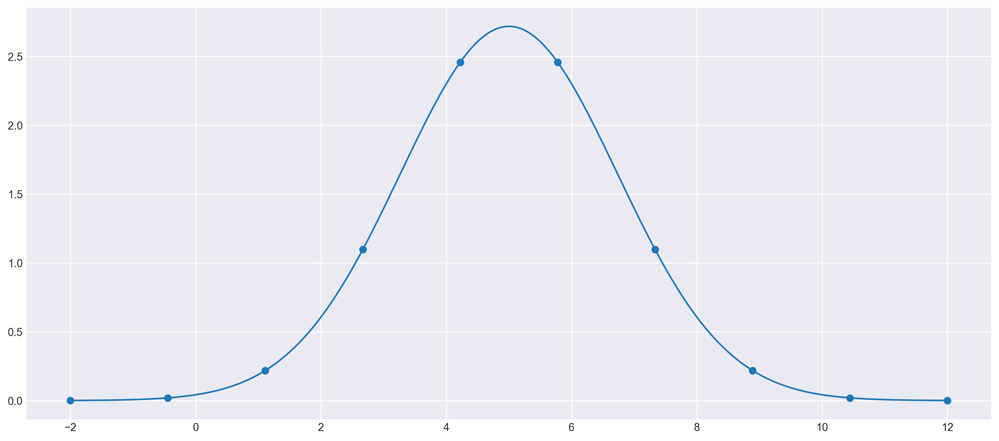

In [288]:
forecast_times = np.linspace(-2, 12, 1024)
trend = np.exp(1-(forecast_times-5)**2/6)
sample_times = np.linspace(-2,12,10)
sampleT = np.exp(1-(sample_times-5)**2/6)
sampleS = 0 * np.cos(2*np.pi*sample_times)/5
sample_values = sampleT + sampleS
plt.figure(figsize=[16, 7])
plt.plot(forecast_times, trend)
plt.scatter(sample_times, sample_values)

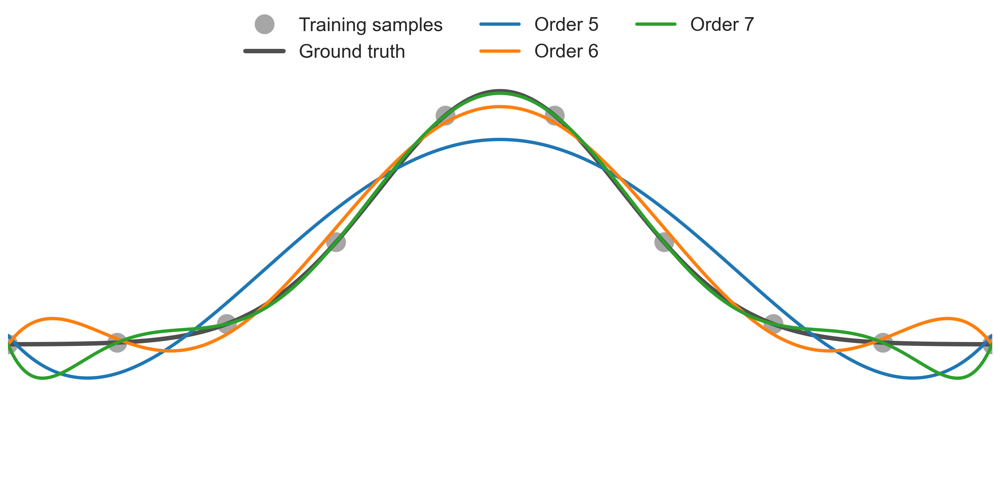

In [289]:
i=0    
plt.figure(figsize=[16,7])
sc_train = plt.errorbar(sample_times, sample_values,
                        yerr=quantile_gauss * sigma_noise, elinewidth=0,
                        ecolor=colors['cyan'], alpha=0.5, zorder=0.5, linewidth=0, marker='o',
                        markerfacecolor=colors['black'],
                        mew=0, markersize=18)
gt, = plt.plot(forecast_times, trend, '-', color=colors['black'], linewidth=4,  zorder=2)
lin_trends=[]
fill_trends=[]
color_keys=list(colors.keys())
for q in [5,7, 9]:
    filt = ccgfilt.ccgFilter(xp=sample_times, yp=sample_values,
                             timezero=-1, numpolyterms=q, numharmonics=3)
    ftimes, fcomponents, fresiduals, fmin_values, fmax_values = priu.postprocess_ccgfilt(filt, seasonal_forecast_times,
                                                                                         forecast_times)
    
    lin_trend, = plt.plot(forecast_times, fcomponents['sum'], '-', color=colors[color_keys[i]], linewidth=3, zorder=2)
    lin_trends.append(lin_trend)
    i+=1


plt.xlim(forecast_times.min(), forecast_times.max())
plt.ylim(-1.5,3)
plt.axis('off')
plt.figlegend([sc_train, gt,*lin_trends],
              ['Training samples', 'Ground truth', *[f'Order {k}'for k in range(5,10)]],
              fontsize='xx-large', markerscale=1, loc=9, ncol=3, fancybox=True)

(-2.0, 12.0, -5.0, 15.0)

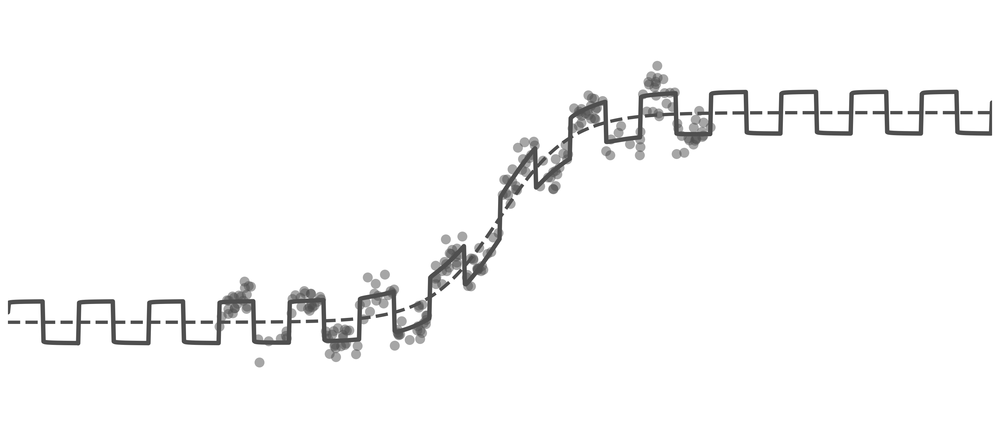

In [305]:
from periodispline.splines.ndsplines import UnivariateSpline
from periodispline.splines.green.univariate import GreenFractionalDerivative
forecast_times = np.linspace(-2, 12, 1024)
spline = UnivariateSpline(weights=np.r_[1, -1], knots=np.r_[0, 1/2], green_function=GreenFractionalDerivative(exponent=1.01, period=1, nogibbs=False))
seas = np.real(spline(forecast_times))
trend = np.real((np.tanh(forecast_times - 5) + 1)/2)
seas *= sigmaS
trend *= sigmaT
sum_ = seas + trend

sample_times = (8-1) * rng.random(size=250) + 1
sample_times = np.sort(sample_times)
sampleS = np.real(sigmaS * spline(sample_times) + sigma_noise * rng.standard_normal(size=sample_times.size) / np.sqrt(2))
sampleT = np.real(sigmaT * (np.tanh(sample_times - 5) + 1)/2 + sigma_noise * rng.standard_normal(size=sample_times.size) / np.sqrt(2))
sample_values = sampleS + sampleT
sample_values = np.real(sample_values)
plt.figure(figsize=[16, 7])
sc_train = plt.errorbar(sample_times, sample_values,
                            yerr=quantile_gauss * sigma_noise, elinewidth=0,
                            ecolor=colors['cyan'], alpha=0.5, zorder=0.5, linewidth=0, marker='o',
                            markerfacecolor=colors['black'],
                            mew=0, markersize=9)
gt, = plt.plot(forecast_times, sum_, '-', color=colors['black'], linewidth=4,  zorder=2)
gt2, = plt.plot(forecast_times, trend, '--', color=colors['black'], linewidth=3,  zorder=2)
plt.xlim(forecast_times.min(), forecast_times.max())
plt.ylim(-5, 15)
plt.axis('off')

In [291]:
forecast_times

array([-2.        , -1.98631476, -1.97262952, ..., 11.97262952,
       11.98631476, 12.        ])

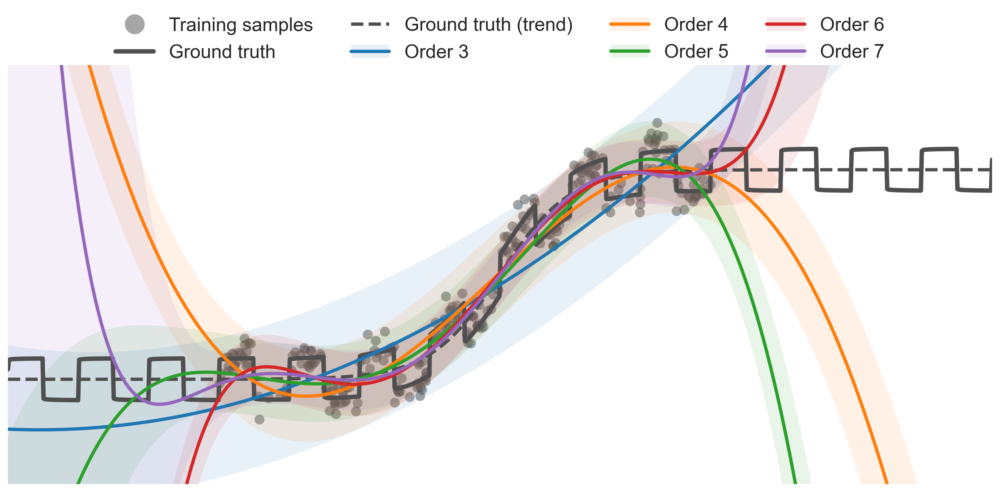

In [307]:
i=0    
plt.figure(figsize=[16,7])
sc_train = plt.errorbar(sample_times, sample_values,
                            yerr=quantile_gauss * sigma_noise, elinewidth=0,
                            ecolor=colors['cyan'], alpha=0.5, zorder=0.5, linewidth=0, marker='o',
                            markerfacecolor=colors['black'],
                            mew=0, markersize=9)
gt, = plt.plot(forecast_times, sum_, '-', color=colors['black'], linewidth=4,  zorder=2)
gt2, = plt.plot(forecast_times, trend, '--', color=colors['black'], linewidth=3,  zorder=2)
lin_trends=[]
fill_trends=[]
color_keys=list(colors.keys())
for q in [3,4,5,6,7]:
    filt = ccgfilt.ccgFilter(xp=sample_times, yp=sample_values,
                             timezero=-1, numpolyterms=q, numharmonics=q)
    ftimes, fcomponents, fresiduals, fmin_values, fmax_values = priu.postprocess_ccgfilt(filt, seasonal_forecast_times,
                                                                                         forecast_times)
    
    lin_trend, = plt.plot(forecast_times, fcomponents['trend'], '-', color=colors[color_keys[i]], linewidth=3, zorder=2)
    fill_trend = plt.fill_between(forecast_times, fmin_values['trend'], fmax_values['trend'], color=colors[color_keys[i]],
                                  alpha=0.1, zorder=1, linewidth=0) 
    lin_trends.append(lin_trend)
    fill_trends.append(fill_trend)
    i+=1


plt.xlim(forecast_times.min(), forecast_times.max())
plt.ylim(-5, 15)
plt.axis('off')
plt.figlegend([sc_train, gt, gt2, *[(lin_trend, fill_trend) for lin_trend, fill_trend in zip(lin_trends, fill_trends)]],
              ['Training samples', 'Ground truth', 'Ground truth (trend)', *[f'Order {k}'for k in range(3,8)]],
              fontsize='xx-large', markerscale=1, loc=9, ncol=4, fancybox=True)

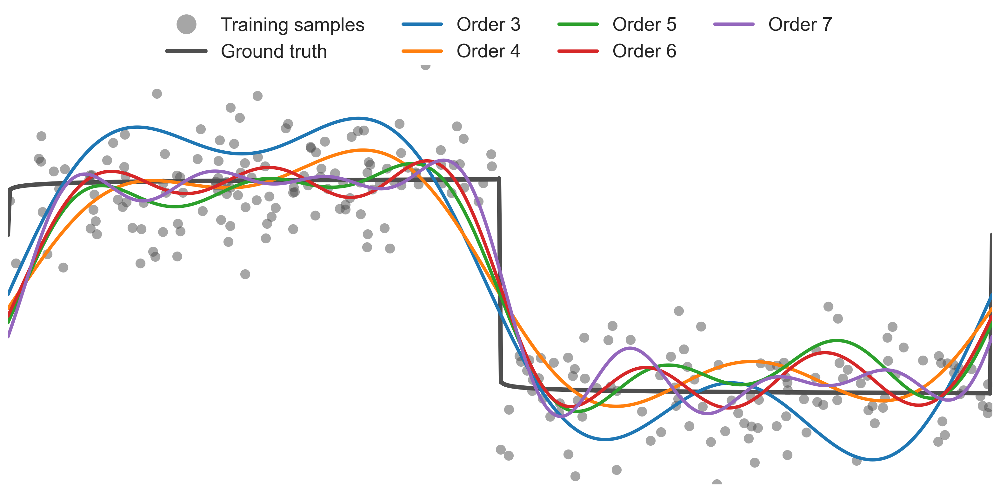

In [312]:
i=0    
plt.figure(figsize=[16,7])
sc_train = plt.errorbar(sample_times % period, sampleS,
                            yerr=quantile_gauss * sigma_noise, elinewidth=0,
                            ecolor=colors['cyan'], alpha=0.5, zorder=0.5, linewidth=0, marker='o',
                            markerfacecolor=colors['black'],
                            mew=0, markersize=9)
gt, = plt.plot(seasonal_forecast_times,sigmaS * np.real(spline(seasonal_forecast_times)), '-', color=colors['black'], linewidth=4,  zorder=2)
lin_seass=[]
color_keys=list(colors.keys())
for q in [3,4,5,6,7]:
    filt = ccgfilt.ccgFilter(xp=sample_times, yp=sample_values,
                             timezero=-1, numpolyterms=q, numharmonics=q)
    ftimes, fcomponents, fresiduals, fmin_values, fmax_values = priu.postprocess_ccgfilt(filt, seasonal_forecast_times,
                                                                                         forecast_times)
    
    lin_seas, = plt.plot(seasonal_forecast_times, fcomponents['seasonal'], '-', color=colors[color_keys[i]], linewidth=3, zorder=2)
    lin_seass.append(lin_seas)
    i+=1


plt.xlim(seasonal_forecast_times.min(), seasonal_forecast_times.max())
plt.ylim(sampleS.min(), sampleS.max())
plt.axis('off')
plt.figlegend([sc_train, gt, *lin_trends],
              ['Training samples', 'Ground truth', *[f'Order {k}'for k in range(3,8)]],
              fontsize='xx-large', markerscale=1, loc=9, ncol=4, fancybox=True)

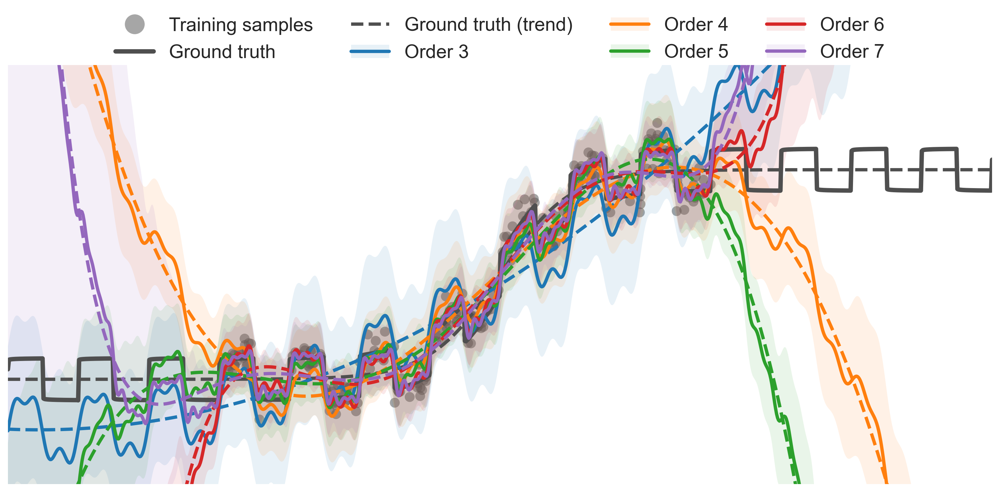

In [321]:
i=0    
plt.figure(figsize=[16,7])
sc_train = plt.errorbar(sample_times, sample_values,
                            yerr=quantile_gauss * sigma_noise, elinewidth=0,
                            ecolor=colors['cyan'], alpha=0.5, zorder=0.5, linewidth=0, marker='o',
                            markerfacecolor=colors['black'],
                            mew=0, markersize=9)
gt, = plt.plot(forecast_times, sum_, '-', color=colors['black'], linewidth=4,  zorder=2)
gt2, = plt.plot(forecast_times, trend, '--', color=colors['black'], linewidth=3,  zorder=2)
lin_trends=[]
fill_trends=[]
color_keys=list(colors.keys())
for q in [3,4,5,6,7]:
    filt = ccgfilt.ccgFilter(xp=sample_times, yp=sample_values,
                             timezero=-1, numpolyterms=q, numharmonics=q)
    ftimes, fcomponents, fresiduals, fmin_values, fmax_values = priu.postprocess_ccgfilt(filt, seasonal_forecast_times,
                                                                                         forecast_times)
    
    lin_trend, = plt.plot(forecast_times, fcomponents['sum'], '-', color=colors[color_keys[i]], linewidth=3, zorder=2)
    fill_trend = plt.fill_between(forecast_times, fmin_values['sum'], fmax_values['sum'], color=colors[color_keys[i]],
                                  alpha=0.1, zorder=1, linewidth=0) 
    plt.plot(forecast_times, fcomponents['trend'], '--', color=colors[color_keys[i]], linewidth=3, zorder=2)
    lin_trends.append(lin_trend)
    fill_trends.append(fill_trend)
    i+=1


plt.xlim(forecast_times.min(), forecast_times.max())
plt.ylim(-5, 15)
plt.axis('off')
plt.figlegend([sc_train, gt, gt2,*[(lin_trend, fill_trend) for lin_trend, fill_trend in zip(lin_trends, fill_trends)]],
              ['Training samples', 'Ground truth', 'Ground truth (trend)', *[f'Order {k}'for k in range(3,8)]],
              fontsize='xx-large', markerscale=1, loc=9, ncol=4, fancybox=True)

/Users/mmjasime/miniconda3/envs/prism/lib/python3.8/site-packages/pycsou/core/functional.py:152: UserWarning: For differentiable and/or linear maps, consider the dedicated classes DifferentiableMap and LinearOperator.
  warnings.warn(


Initial penalty: 0.2


  0%|          | 0/10000 [00:00<?, ?it/s]

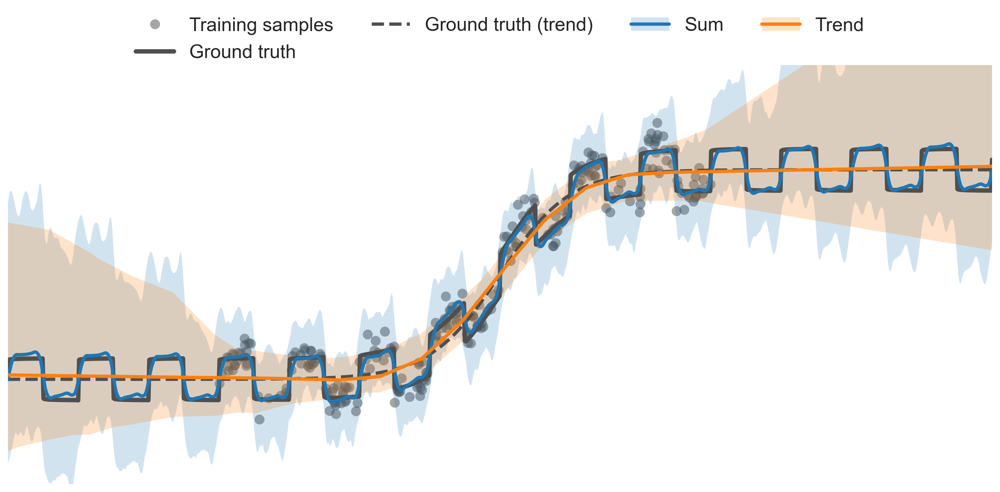

In [331]:

streg = prism.SeasonalTrendRegression(sample_times=sample_times,
                                          sample_values=sample_values,
                                          period=period, forecast_times=forecast_times,
                                          seasonal_forecast_times=seasonal_forecast_times, penalty_tuning=False,
                                          penalty_strength=.2,
                                          nb_of_knots=(16, 16), spline_orders=(3, 2),
                                          robust=False, tol=1e-3)
# Fit the model
coeffs, mu = streg.fit(verbose=None)
pseas, ptrend, psum, pgrowth = streg.predict(growth=True)
pmin_values, pmax_values, _ = streg.sample_credible_region(n_samples=1e4, return_samples=False)
plt.figure(figsize=[16, 7])
sc_train = plt.errorbar(sample_times, sample_values,
                            yerr=quantile_gauss * sigma_noise, elinewidth=0,
                            ecolor=colors['cyan'], alpha=0.5, zorder=0.5, linewidth=0, marker='o',
                            markerfacecolor=colors['black'],
                            mew=0, markersize=9)
gt, = plt.plot(forecast_times, sum_, '-', color=colors['black'], linewidth=4,  zorder=2)
gt2, = plt.plot(forecast_times, trend, '--', color=colors['black'], linewidth=3,  zorder=2)
lin_sum, = plt.plot(forecast_times, psum, '-', linewidth=3, color=colors['blue'], zorder=2)
fill_sum = plt.fill_between(forecast_times, pmin_values['sum'], pmax_values['sum'],
                            alpha=0.2, color=colors['blue'], zorder=1, linewidth=0)
lin_trend, = plt.plot(forecast_times, ptrend, '-', linewidth=3, color=colors['orange'], zorder=2)
fill_trend = plt.fill_between(forecast_times, pmin_values['trend'], pmax_values['trend'],
                              alpha=0.22, color=colors['orange'], zorder=1, linewidth=0)
plt.ylim(-5, 15)
plt.xlim(forecast_times.min(), forecast_times.max())
plt.axis('off')
plt.figlegend([sc_train, gt, gt2,(lin_sum, fill_sum), (lin_trend, fill_trend)],
              ['Training samples', 'Ground truth', 'Ground truth (trend)', 'Sum', 'Trend'], 
              markerscale=1, loc=9, ncol=4, fancybox=True, fontsize='xx-large')